### Importación de datos



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

# Unificar todos los datos en un único DataFrame "df"

# Añadir columna que identifique cada tienda
tienda["Tienda"] = "Tienda 1"
tienda2["Tienda"] = "Tienda 2"
tienda3["Tienda"] = "Tienda 3"
tienda4["Tienda"] = "Tienda 4"

# Concatenar todo en df
df = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

# Confirmar que todo se cargó correctamente
df.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,Tienda
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175,Tienda 1
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359,Tienda 1
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444,Tienda 1
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250,Tienda 1
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359,Tienda 1


#1. Análisis de facturación



/tmp/ipython-input-1884730594.py:14: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


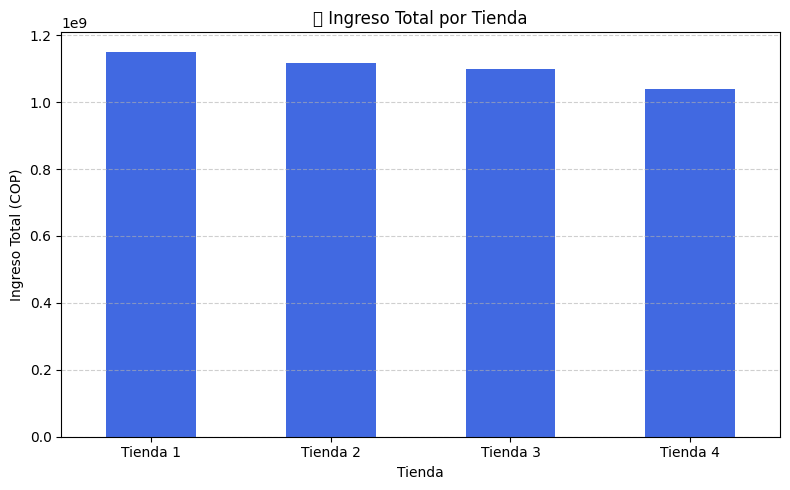

,Precio
Tienda,
Tienda 1,1.150880e+09
Tienda 2,1.116344e+09
Tienda 3,1.098020e+09
Tienda 4,1.038376e+09


In [2]:
import matplotlib.pyplot as plt

# Agrupar por tienda y sumar precios
ingresos = df.groupby("Tienda")["Precio"].sum().sort_values(ascending=False)

# Gráfico de barras
plt.figure(figsize=(8, 5))
ingresos.plot(kind='bar', color='royalblue')
plt.title("💰 Ingreso Total por Tienda")
plt.xlabel("Tienda")
plt.ylabel("Ingreso Total (COP)")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

ingresos.round(2)


# 2. Ventas por categoría

/tmp/ipython-input-2014779348.py:15: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


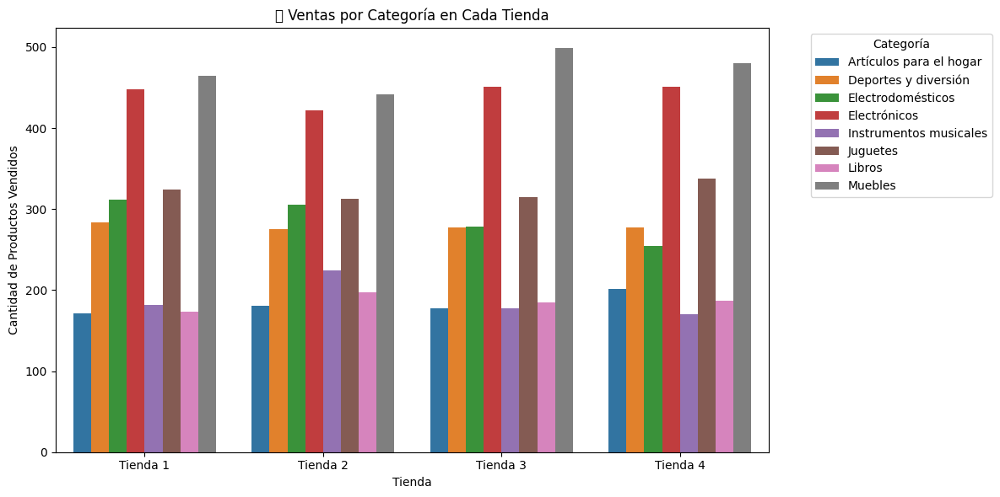

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

# Agrupar por tienda y categoría del producto
ventas_categoria = df.groupby(["Tienda", "Categoría del Producto"]).size().reset_index(name="Ventas")

# Visualizar con gráfico de barras agrupadas
plt.figure(figsize=(12, 6))
sns.barplot(data=ventas_categoria, x="Tienda", y="Ventas", hue="Categoría del Producto")

plt.title("📦 Ventas por Categoría en Cada Tienda")
plt.xlabel("Tienda")
plt.ylabel("Cantidad de Productos Vendidos")
plt.legend(title="Categoría", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# 3. Calificación promedio de la tienda


/tmp/ipython-input-507424222.py:14: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


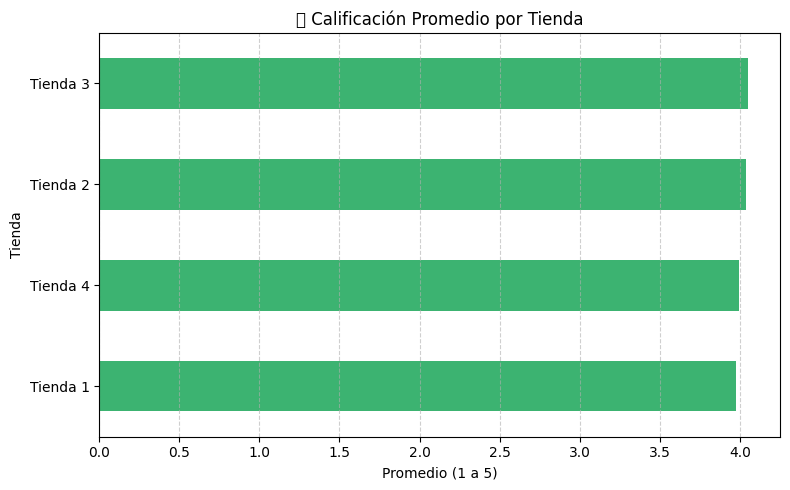

,Calificación
Tienda,
Tienda 1,3.98
Tienda 4,4.00
Tienda 2,4.04
Tienda 3,4.05


In [4]:
import matplotlib.pyplot as plt

# Agrupar por tienda y calcular promedio de calificación
calificaciones = df.groupby("Tienda")["Calificación"].mean().sort_values()

# Visualización
plt.figure(figsize=(8, 5))
calificaciones.plot(kind='barh', color='mediumseagreen')

plt.title("⭐ Calificación Promedio por Tienda")
plt.xlabel("Promedio (1 a 5)")
plt.ylabel("Tienda")
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

calificaciones.round(2)


# 4. Productos más y menos vendidos

/tmp/ipython-input-1279010356.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x="CantidadVendida", y="Producto", palette="Blues_d")


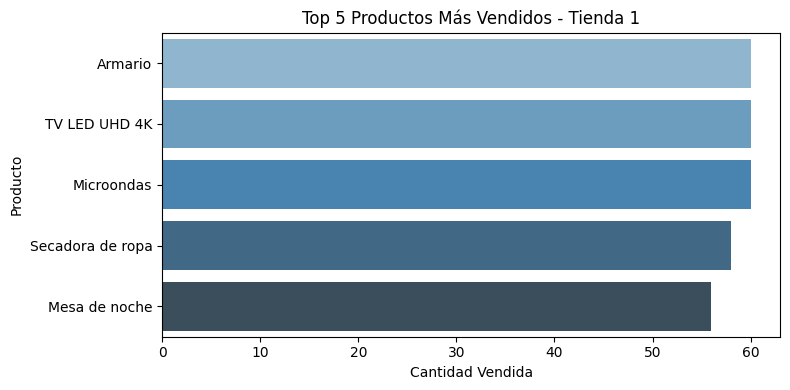

/tmp/ipython-input-1279010356.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x="CantidadVendida", y="Producto", palette="Blues_d")


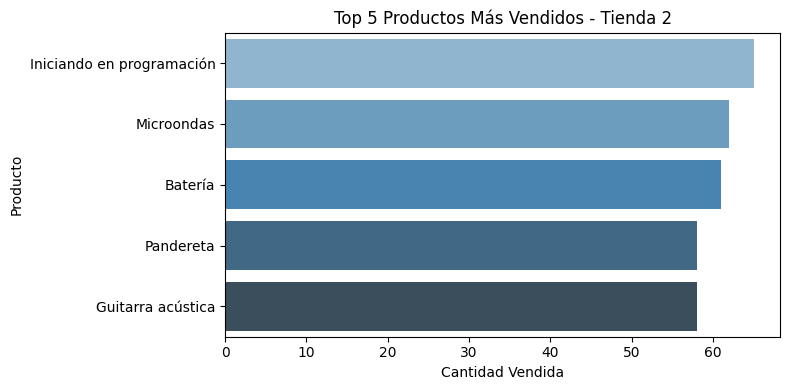

/tmp/ipython-input-1279010356.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x="CantidadVendida", y="Producto", palette="Blues_d")


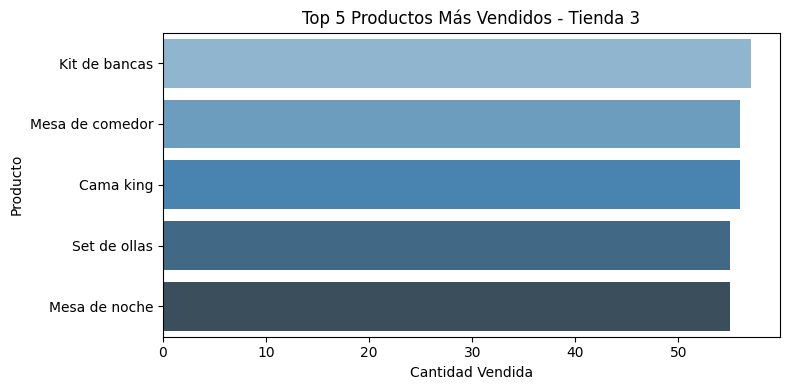

/tmp/ipython-input-1279010356.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x="CantidadVendida", y="Producto", palette="Blues_d")


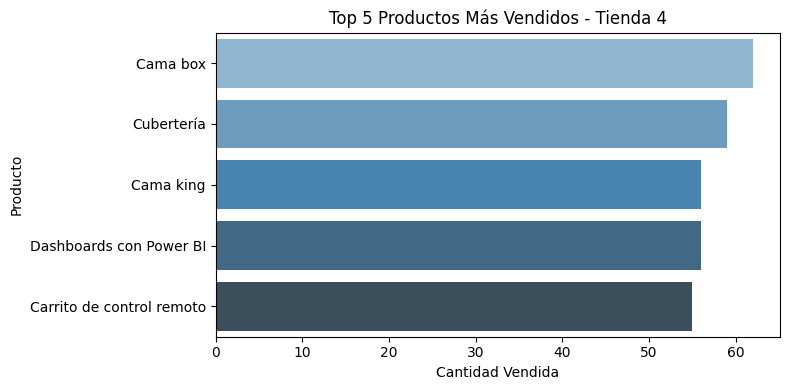

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualizar los 5 más vendidos por tienda
for tienda in ventas_productos["Tienda"].unique():
    top5 = ventas_productos[ventas_productos["Tienda"] == tienda].sort_values("CantidadVendida", ascending=False).head(5)

    plt.figure(figsize=(8, 4))
    sns.barplot(data=top5, x="CantidadVendida", y="Producto", palette="Blues_d")
    plt.title(f"Top 5 Productos Más Vendidos - {tienda}")
    plt.xlabel("Cantidad Vendida")
    plt.ylabel("Producto")
    plt.tight_layout()
    plt.show()


# 5. Envío promedio por tienda

/tmp/ipython-input-4015399064.py:14: UserWarning: Glyph 128666 (\N{DELIVERY TRUCK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128666 (\N{DELIVERY TRUCK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


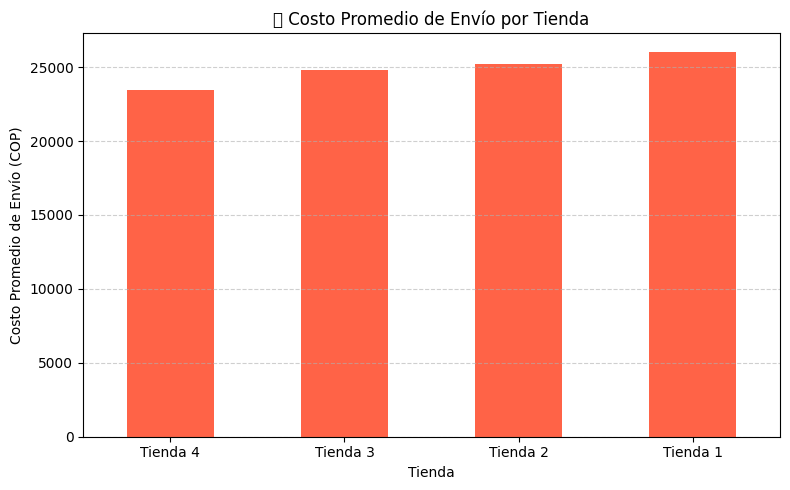

,Costo de envío
Tienda,
Tienda 4,23459.46
Tienda 3,24805.68
Tienda 2,25216.24
Tienda 1,26018.61


In [10]:
import matplotlib.pyplot as plt

# Agrupar por tienda y calcular el promedio del costo de envío
envio_promedio = df.groupby("Tienda")["Costo de envío"].mean().sort_values()

# Visualización
plt.figure(figsize=(8, 5))
envio_promedio.plot(kind='bar', color='tomato')
plt.title("🚚 Costo Promedio de Envío por Tienda")
plt.xlabel("Tienda")
plt.ylabel("Costo Promedio de Envío (COP)")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

envio_promedio.round(2)


In [13]:
df[["Tienda", "lat", "lon"]].head()


,Tienda,lat,lon
0,Tienda 1,4.60971,-74.08175
1,Tienda 1,6.25184,-75.56359
2,Tienda 1,10.39972,-75.51444
3,Tienda 1,3.43722,-76.52250
4,Tienda 1,6.25184,-75.56359


/tmp/ipython-input-400240613.py:21: UserWarning: Glyph 128506 (\N{WORLD MAP}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128506 (\N{WORLD MAP}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


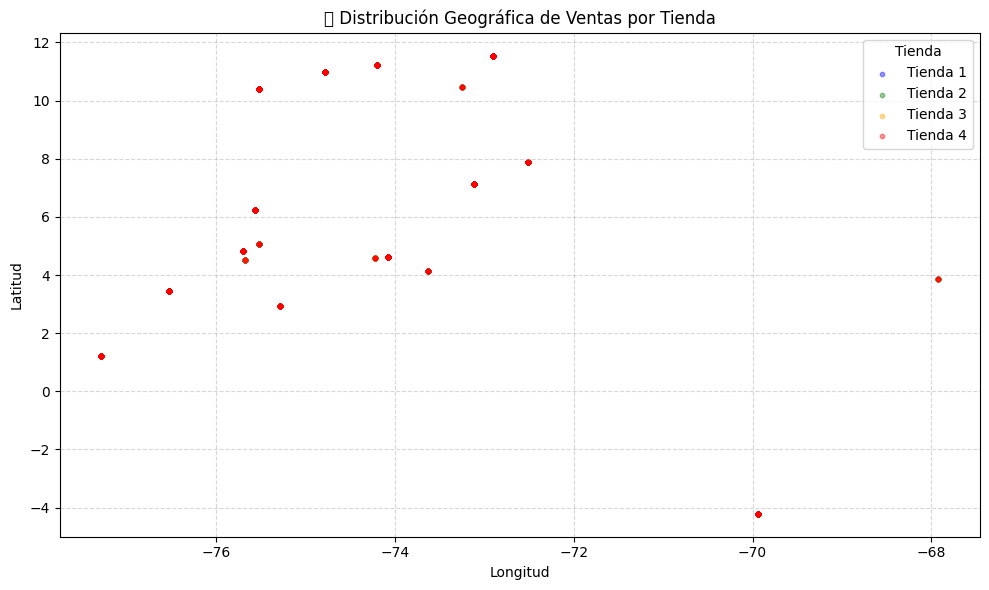

In [12]:
import matplotlib.pyplot as plt

# Colores por tienda
colores = {
    "Tienda 1": "blue",
    "Tienda 2": "green",
    "Tienda 3": "orange",
    "Tienda 4": "red"
}

plt.figure(figsize=(10, 6))
for tienda, datos in df.groupby("Tienda"):
    plt.scatter(datos["lon"], datos["lat"],
                alpha=0.4, label=tienda, s=10, c=colores[tienda])

plt.title("🗺️ Distribución Geográfica de Ventas por Tienda")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.legend(title="Tienda")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [14]:
import folium
from folium.plugins import MarkerCluster

# Crear mapa centrado en América Latina
mapa = folium.Map(location=[-10, -70], zoom_start=4)

# Agrupador de marcadores
cluster = MarkerCluster().add_to(mapa)

# Agregar puntos
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=3,
        color=colores[row["Tienda"]],
        fill=True,
        fill_opacity=0.6,
        popup=f"Tienda: {row['Tienda']}"
    ).add_to(cluster)

mapa